# Content

- Import default Library & Check missing Data(Missingno)
- Which words are most used in Name & Subtitle(wordcloud)
- Which words are most used in Name & Subtitle(wordcloud)
- Show Icon(requests)
- Average User Rating(Seaborn:countplot)
- Relationship between Prices and Rating(Seaborn:regplot)

# Import default Library & Check Data

In [50]:
# Data Processing
import numpy as np
import pandas as pd

# Basic visualization
import matplotlib
import matplotlib.pyplot as plt
plt.style.use('ggplot')
plt.rcParams['figure.dpi'] = 300
import seaborn as sns
sns.set_palette('husl')

# Bokeh (interactive visualization)
import bokeh
from bokeh.io import show, output_notebook
from bokeh.palettes import Spectral9
from bokeh.plotting import figure
output_notebook() 

# Special Visualization
%pip install wordcloud
%pip install missingno
import wordcloud, missingno
from wordcloud import WordCloud # wordcloud
import missingno as msno # check missing value
import networkx as nx

#data
data = pd.read_csv('mobile strategy games.csv')

Loading BokehJS ...

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [75]:
#check data: show the head of data
data.head()

,Name,Subtitle,Icon URL,Average User Rating,User Rating Count,Price,In-app Purchases,Description,Developer,Age Rating,Languages,Size,Primary Genre,Genres,Original Release Date,Current Version Release Date
0,Sudoku,NaN,https://is2-ssl.mzstatic.com/image/thumb/Purpl...,4.0,3553.0,2.99,NaN,"Join over 21,000,000 of our fans and download ...",Mighty Mighty Good Games,4+,"DA, NL, EN, FI, FR, DE, IT, JA, KO, NB, PL, PT...",15853568.0,Games,"Games, Strategy, Puzzle",11/07/2008,30/05/2017
1,Reversi,NaN,https://is4-ssl.mzstatic.com/image/thumb/Purpl...,3.5,284.0,1.99,NaN,"The classic game of Reversi, also known as Oth...",Kiss The Machine,4+,EN,12328960.0,Games,"Games, Strategy, Board",11/07/2008,17/05/2018
2,Morocco,NaN,https://is5-ssl.mzstatic.com/image/thumb/Purpl...,3.0,8376.0,0.00,NaN,Play the classic strategy game Othello (also k...,Bayou Games,4+,EN,674816.0,Games,"Games, Board, Strategy",11/07/2008,5/09/2017
3,Sudoku (Free),NaN,https://is3-ssl.mzstatic.com/image/thumb/Purpl...,3.5,190394.0,0.00,NaN,"Top 100 free app for over a year.\nRated ""Best...",Mighty Mighty Good Games,4+,"DA, NL, EN, FI, FR, DE, IT, JA, KO, NB, PL, PT...",21552128.0,Games,"Games, Strategy, Puzzle",23/07/2008,30/05/2017
4,Senet Deluxe,NaN,https://is1-ssl.mzstatic.com/image/thumb/Purpl...,3.5,28.0,2.99,NaN,"""Senet Deluxe - The Ancient Game of Life and A...",RoGame Software,4+,"DA, NL, EN, FR, DE, EL, IT, JA, KO, NO, PT, RU...",34689024.0,Games,"Games, Strategy, Board, Education",18/07/2008,22/07/2018


In [74]:
#check data information_categorical
data.describe(include='O')

,Name,Subtitle,Icon URL,In-app Purchases,Description,Developer,Age Rating,Languages,Primary Genre,Genres,Original Release Date,Current Version Release Date
count,17007,5261,17007,7683,17007,17007,17007,16947,17007,17007,17007,17007
unique,16847,5010,16847,3803,16473,8693,4,990,21,1004,3084,2512
top,FENRIR Pirates - Pathbook game,Emoji Stickers,https://is3-ssl.mzstatic.com/image/thumb/Purpl...,0.99,#NAME?,Tapps Tecnologia da Informa\xe7\xe3o Ltda.,4+,EN,Games,"Games, Strategy, Puzzle",2/09/2016,1/08/2019
freq,2,14,2,943,17,123,11806,12467,16286,778,75,118


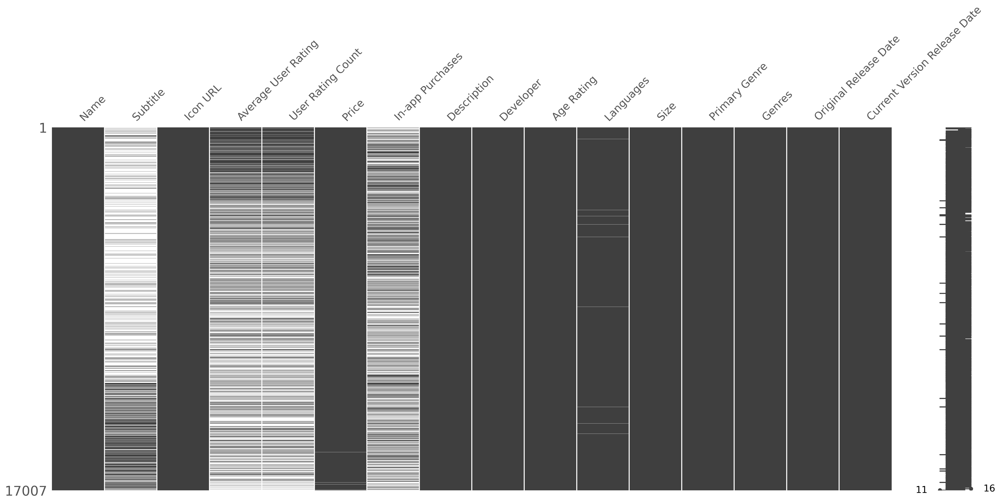

In [72]:
#check missing data
msno.matrix(data)

Missingno allows us to get a visual summary of the completeness of this dataset. 
 Columns that have large amounts of missing data: 
 - subtitle
 - average user rating
 - user rating count
 - in-app purchases

In [19]:
print(data.columns)

Index(['Name', 'Subtitle', 'Icon URL', 'Average User Rating',
       'User Rating Count', 'Price', 'In-app Purchases', 'Description',
       'Developer', 'Age Rating', 'Languages', 'Size', 'Primary Genre',
       'Genres', 'Original Release Date', 'Current Version Release Date'],
      dtype='object')


# Which words are most used (in Name & Subtitle)

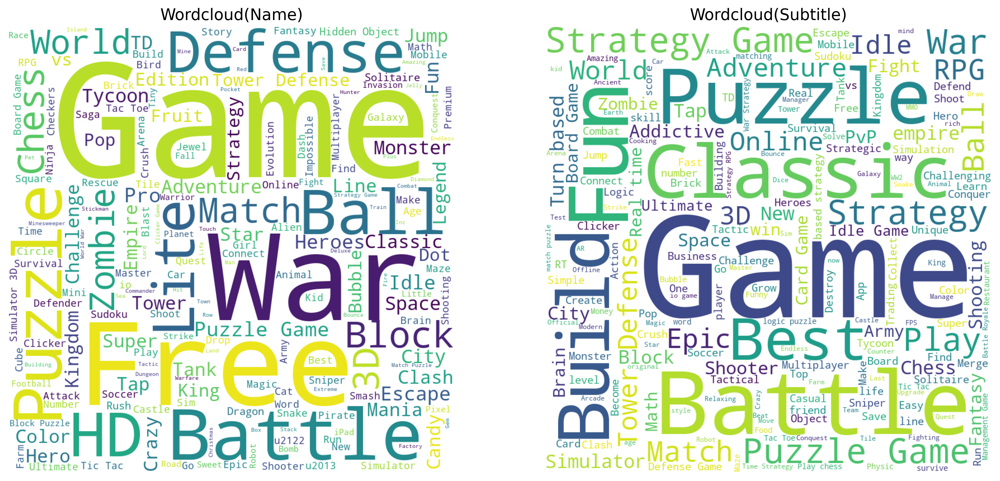

CPU times: user 3.18 s, sys: 306 ms, total: 3.49 s
Wall time: 3.5 s


In [27]:
%%time
fig, ax = plt.subplots(1, 2, figsize=(16,32))
wordcloud = WordCloud(background_color='white',width=800, height=800).generate(' '.join(data['Name']))
wordcloud_sub = WordCloud(background_color='white',width=800, height=800).generate(' '.join(data['Subtitle'].dropna().astype(str)) )
ax[0].imshow(wordcloud)
ax[0].axis('off')
ax[0].set_title('Wordcloud(Name)')
ax[1].imshow(wordcloud_sub)
ax[1].axis('off')
ax[1].set_title('Wordcloud(Subtitle)')
plt.show()

- Top 5 words used in Name column
 - Game, Free, War, Defense, Puzzle
- Top 5 words used in Subtitle column
 - Game, Classic, Battle, Puzzle, Best

# Show Icon (requests&Crawling URL)

Icon data is provided in URL. Let's get 100 images by crawling.

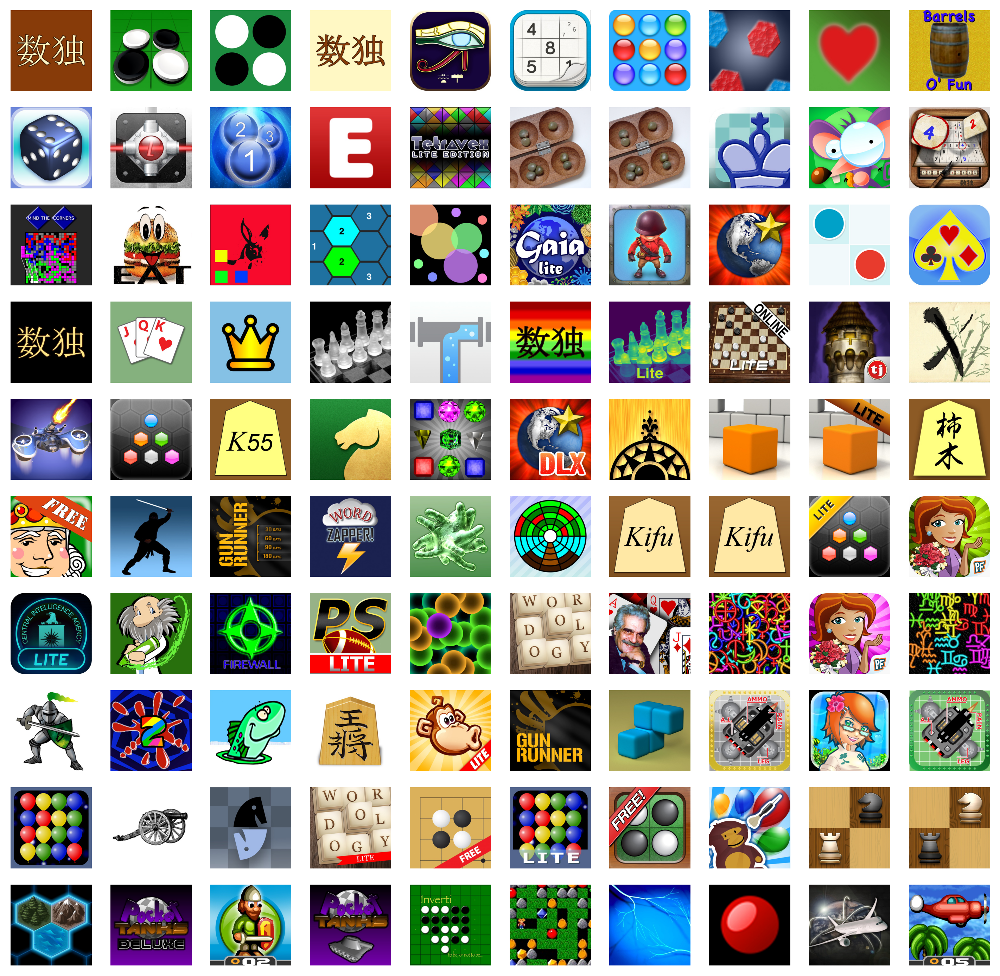

CPU times: user 8.16 s, sys: 298 ms, total: 8.46 s
Wall time: 34.3 s


In [32]:
%%time
import matplotlib.pyplot as plt
import requests
from PIL import Image
from io import BytesIO

fig, ax = plt.subplots(10,10, figsize=(12,12))
    
for i in range(100):
    r = requests.get(data['Icon URL'][i])
    im = Image.open(BytesIO(r.content))
    ax[i//10][i%10].imshow(im)
    ax[i//10][i%10].axis('off')
plt.show()

# Average User Rating  

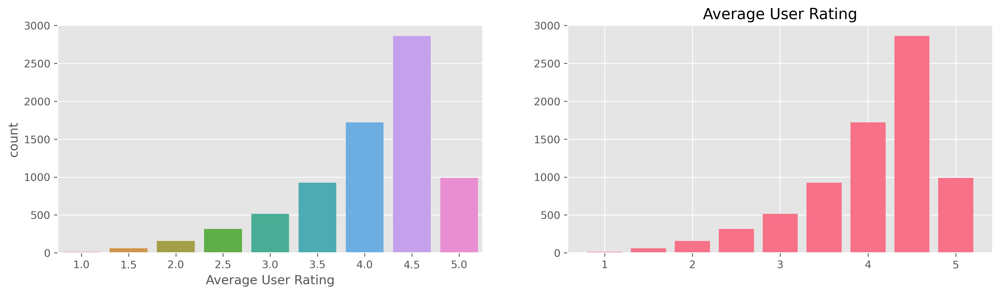

In [55]:
#use seaborn and matplotlib
fig, ax = plt.subplots(1,2,figsize=(16, 4)) 
sns.countplot(data['Average User Rating'],ax=ax[0]) 
ax[1].bar(aur.index, aur, width=0.4)
ax[1].set_title('Average User Rating')
plt.show()

User mostly give a rating of 4.5/5 for mobile STG games

# Relationship between Prices and Rating

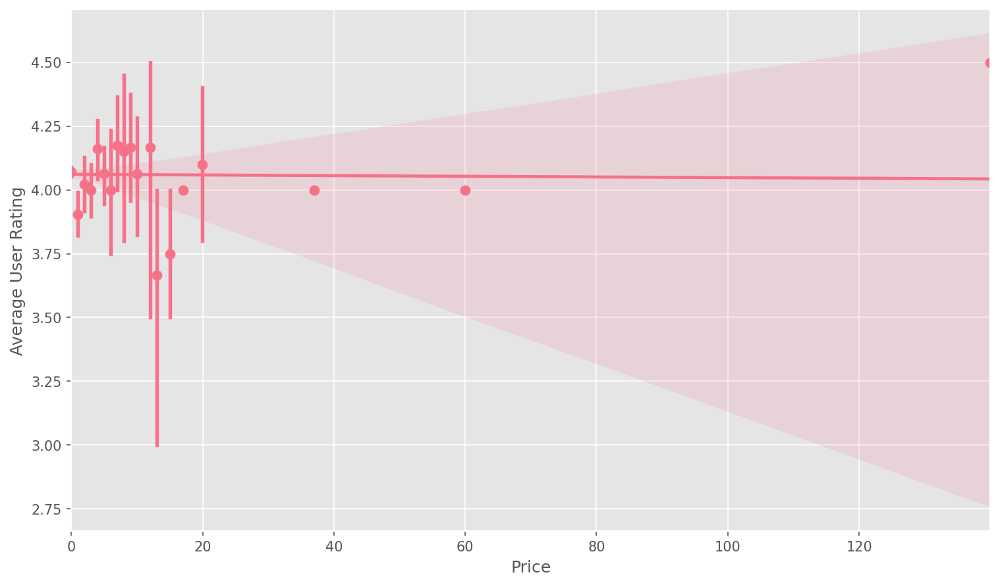

In [36]:
#use regplot in seaborn to visualize linear regression
fig,ax = plt.subplots(1,1,figsize=(12,7),dpi=150) 
sns.regplot(data=data,x='Price',y='Average User Rating',ax=ax,x_estimator=np.mean)
plt.show()

Little relationship between games'price and rating.